# 1. Simple Image Operations

## Table of Contents
1. [Libraries](#libraries)
2. [Loading Images](#loading)
3. [Resizing Images](#resize)
4. [Negative Images](#negative)
5. [Logarithmic Transformation](#log)
6. [Image Binarizer](#bin)
7. [Image Quantizer](#quant)
8. [Grayscale](#grayscale)
9. [Contrast](#contrast)
10. [Brightness](#brightness)
11. [Negative](#negative2)
12. [Gamma Correction](#gamma)
13. [Substract Images](#substract)

## Importing Libraries <a class="anchor" id="libraries" ></a>

In [103]:
from matplotlib import image as mpimg
import matplotlib.pyplot as plt
import numpy as np
import cv2

## Loading Images <a class="anchor" id="loading"></a>

<class 'numpy.ndarray'>


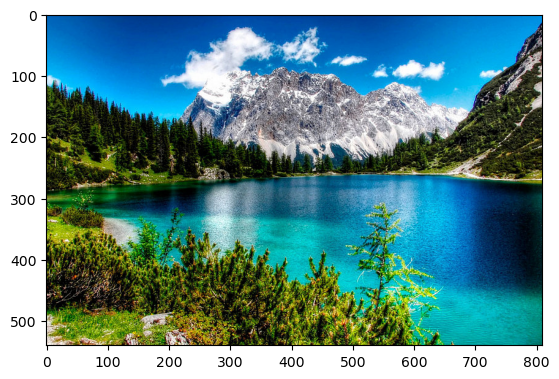

In [104]:
img1 = mpimg.imread('image.jpg')
plt.imshow(img1)
print(type(img1))

Look at the shape of this array:

In [105]:
img1.shape

(540, 810, 3)

The image is actually composed of three "layers, or *channels*, for red, green, and blue (RGB) pixel intensities.

Display the same image but this time we'll use another popular Python library for working with images - **cv2**.

numpy.ndarray

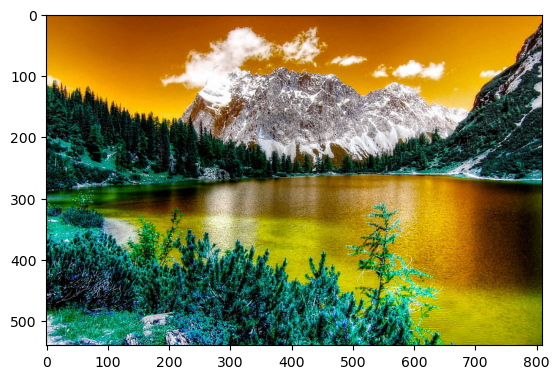

In [106]:
img2 = cv2.imread('image.jpg')
plt.imshow(img2)
type(img2)

The trouble is that cv2 loads the array of image data with the channels ordered as blue, green, red (BGR) instead of red, green blue (RGB). 

Let's fix that

AxesImage(shape=(540, 810, 3))


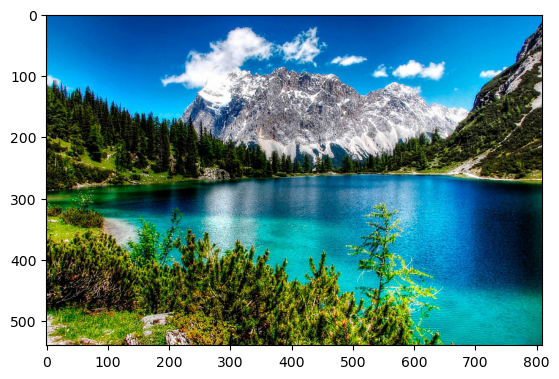

In [107]:
img2 = cv2.cvtColor(img2, cv2.COLOR_BGR2RGB)
print(plt.imshow(img2))

Lastly, one more commonly used library for image processing in Python we should consider - **PIL**:

<class 'PIL.JpegImagePlugin.JpegImageFile'>


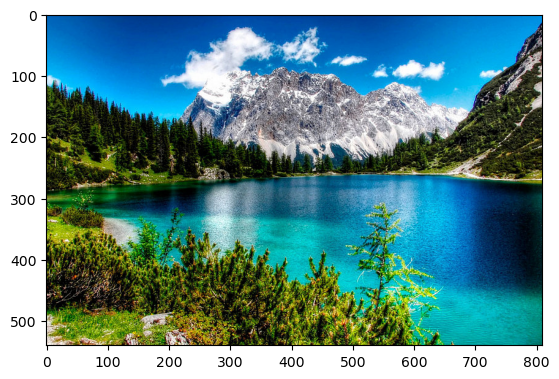

In [108]:
from PIL import Image
import matplotlib.pyplot as plt

img3 = Image.open('image.jpg')
plt.imshow(img3)
print(type(img3))

It's easy to convert a PIL JpegImageFile to a numpy array

In [109]:
img3 = np.array(img3)
img3.shape

(540, 810, 3)

Saving a numpy array in an optimized format, should you need to persist images into storage

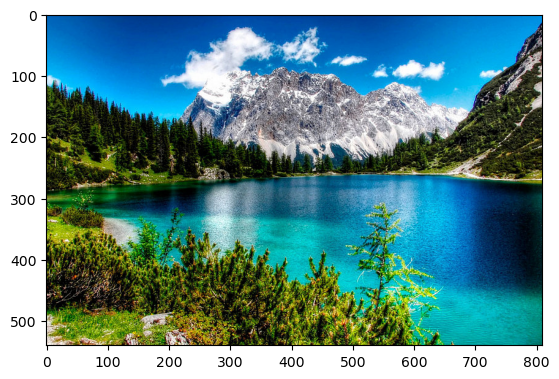

In [110]:
# Save the image
np.save('img.npy', img3)

# Load the image
img3 = np.load('img.npy')

plt.imshow(img3)

## Resizing an Image <a class="anchor" id="resize"></a>
One of the most common manipulations of an image is to resize it. 

Generally, we want to ensure that all of your training images have consistent dimensions.

Original size: 810 x 540
New size: 200 x 200


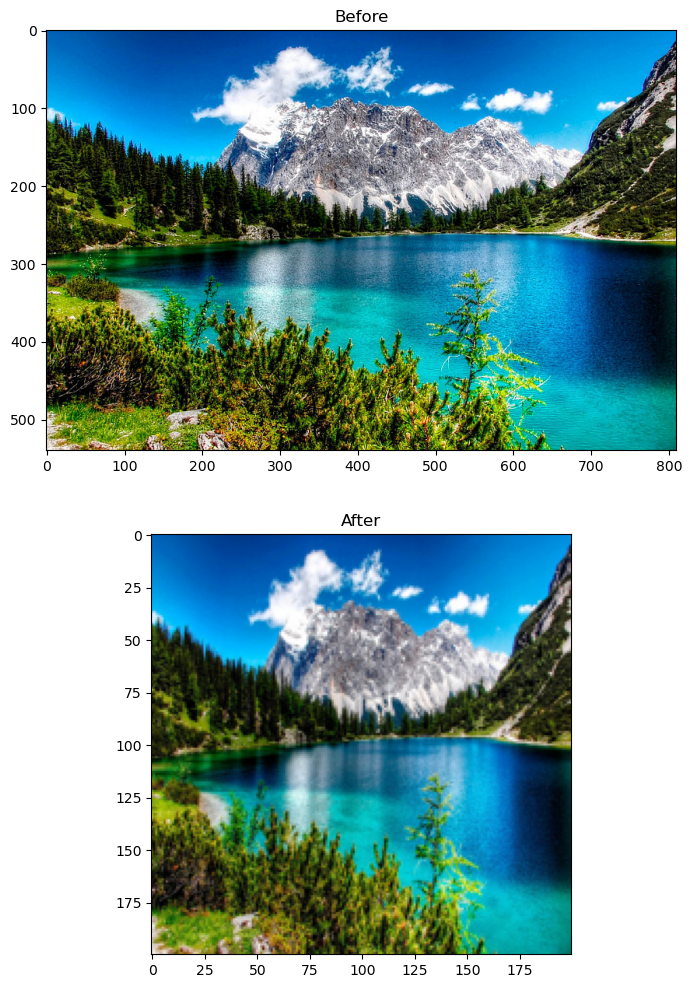

In [111]:
from PIL import Image, ImageOps

# Load the image array into a PIL Image
orig_img = Image.fromarray(img3)

# Get the image size
o_h, o_w = orig_img.size
print('Original size:', o_h, 'x', o_w)

# We'll resize this so it's 200 x 200
target_size = (200,200)
new_img = orig_img.resize(target_size)
n_h, n_w = new_img.size
print('New size:', n_h, 'x', n_w)

# Show the original and resized images
# Create a figure
fig = plt.figure(figsize=(12, 12))

# Subplot for original image
a=fig.add_subplot(2,1,1)
imgplot = plt.imshow(orig_img)
a.set_title('Before')

# Subplot for resized image
a=fig.add_subplot(2,1,2)
imgplot = plt.imshow(new_img)
a.set_title('After')

plt.show()


If we want to resize the image and change its shape without distorting it, we'll need to *scale* the image so that its largest dimension fits our new desired size.

Original size: 810 x 540
Scaled size: 200 x 133
New size: 200 x 200


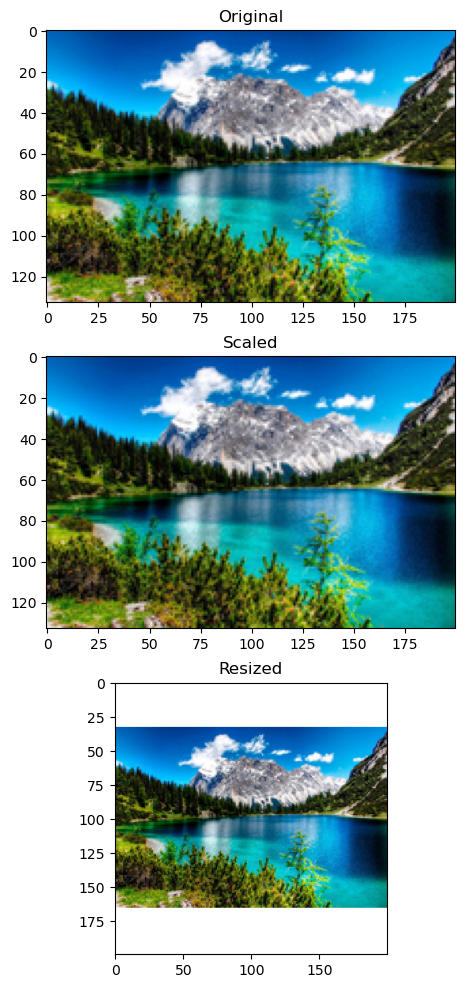

In [112]:
# Get the image size
orig_height, orig_width = orig_img.size
print('Original size:', orig_height, 'x', orig_width)

# We'll resize this so it's 200 x 200
target_size = (200,200)

# Scale the image to the new size using the thumbnail method
scaled_img = orig_img
scaled_img.thumbnail(target_size, Image.Resampling.LANCZOS)
scaled_height, scaled_width = scaled_img.size
print('Scaled size:', scaled_height, 'x', scaled_width)

# Create a new white image of the target size to be the background
new_img = Image.new("RGB", target_size, (255, 255, 255))

# paste the scaled image into the center of the white background image
new_img.paste(scaled_img, (int((target_size[0] - scaled_img.size[0]) / 2), int((target_size[1] - scaled_img.size[1]) / 2)))
new_height, new_width = new_img.size
print('New size:', new_height, 'x', new_width)

# Show the original and resized images
# Create a figure
fig = plt.figure(figsize=(12, 12))

# Subplot for original image
a=fig.add_subplot(3,1,1)
imgplot = plt.imshow(orig_img)
a.set_title('Original')

# Subplot for scaled image
a=fig.add_subplot(3,1,2)
imgplot = plt.imshow(scaled_img)
a.set_title('Scaled')

# Subplot for resized image
a=fig.add_subplot(3,1,3)
imgplot = plt.imshow(new_img)
a.set_title('Resized')

plt.show()

## Negative Images <a class="anchor" id="negative"></a>

In [113]:
orig_img = cv2.imread('image.jpg')
orig_img = cv2.cvtColor(orig_img, cv2.COLOR_BGR2RGB)
img_neg = 255 - orig_img

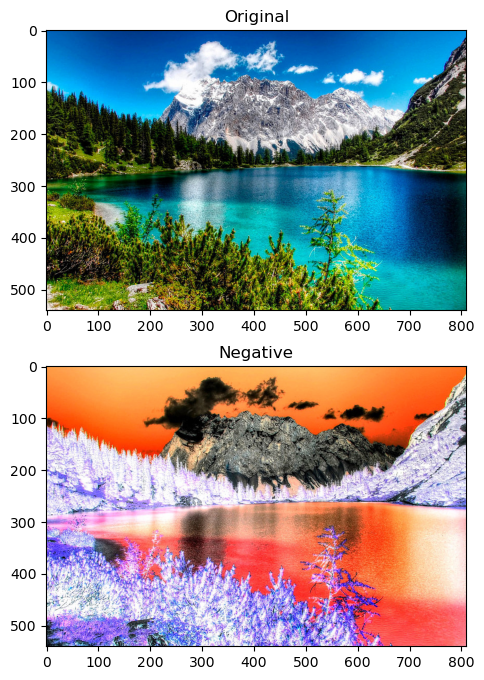

In [114]:
fig = plt.figure(figsize=(8, 8))

# Subplot for original image
a=fig.add_subplot(2,1,1)
imgplot = plt.imshow(orig_img)
a.set_title('Original')

a = fig.add_subplot(2,1,2)
imgplot = plt.imshow(img_neg)
a.set_title('Negative')

plt.show()

## Logarithmic Transformation <a class="anchor" id="log"></a>

$$
S = c * log (1 + r)
$$

where,
- $R$ = input pixel value
- $C$ = scaling constant and
- $S$ = output pixel value

The value of $c$ is chosen such that we get the maximum output value corresponding to the bit size used. So, the formula for calculating $c$  is as follows:

$c = 255 / (log (1 + $ max input pixel value $))$

In [115]:
orig_img = cv2.imread('image.jpg')
orig_img = cv2.cvtColor(orig_img, cv2.COLOR_BGR2RGB)

# Apply log transformation method
c = 255 / np.log(1 + np.max(orig_img))
log_img = c * (np.log(orig_img + 1))

# Specify the data type so that
# float value will be converted to int
log_img = np.array(log_img, dtype = np.uint8)

/var/folders/7t/bjx6ywvx6xl_vxwwz13b9rqh0000gn/T/ipykernel_87467/4086738096.py:6: RuntimeWarning: divide by zero encountered in log
  log_img = c * (np.log(orig_img + 1))
/var/folders/7t/bjx6ywvx6xl_vxwwz13b9rqh0000gn/T/ipykernel_87467/4086738096.py:10: RuntimeWarning: invalid value encountered in cast
  log_img = np.array(log_img, dtype = np.uint8)


Log transformation of gives actual information by enhancing the image. If we apply this method in an image having higher pixel values then it will enhance the image more and actual information of the image will be lost.

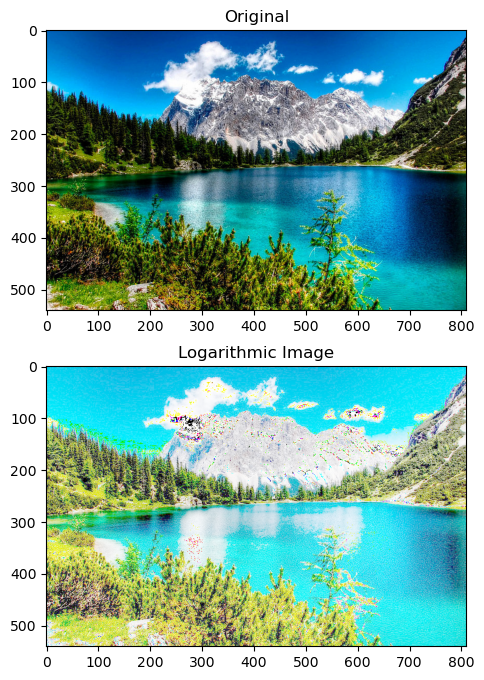

In [116]:
fig = plt.figure(figsize=(8, 8))

# Subplot for original image
a=fig.add_subplot(2,1,1)
imgplot = plt.imshow(orig_img)
a.set_title('Original')

a = fig.add_subplot(2,1,2)
imgplot = plt.imshow(log_img)
a.set_title('Logarithmic Image')

plt.show()

## Image Binarizer (Thresholding) <a class="anchor" id="bin"></a>

Binarize pixels (set pixel values to 0 or 1) according to a threshold.

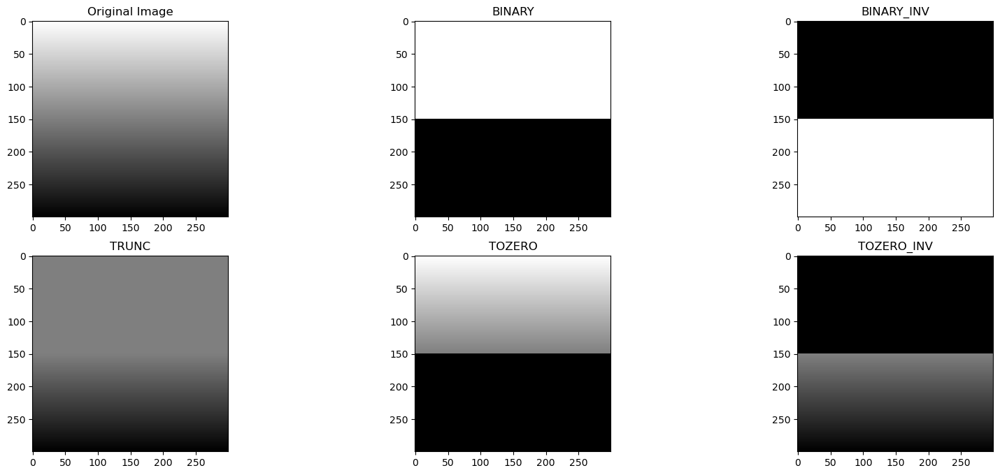

In [117]:
orig_img = cv2.imread('linear_gradient.png')
orig_img = cv2.cvtColor(orig_img, cv2.COLOR_BGR2RGB)

ret,thresh1 = cv2.threshold(orig_img,127,255,cv2.THRESH_BINARY)
ret,thresh2 = cv2.threshold(orig_img,127,255,cv2.THRESH_BINARY_INV)
ret,thresh3 = cv2.threshold(orig_img,127,255,cv2.THRESH_TRUNC)
ret,thresh4 = cv2.threshold(orig_img,127,255,cv2.THRESH_TOZERO)
ret,thresh5 = cv2.threshold(orig_img,127,255,cv2.THRESH_TOZERO_INV)
 
titles = ['Original Image','BINARY','BINARY_INV','TRUNC','TOZERO','TOZERO_INV']
images = [orig_img, thresh1, thresh2, thresh3, thresh4, thresh5]
n = np.arange(6)

fig = plt.figure(figsize=(20, 8))
for i in n:
  plt.subplot(2,3,i+1), plt.imshow(images[i],'gray')
  plt.title(titles[i])

plt.show()

## Image Quantizer  <a class="anchor" id="quant"></a>

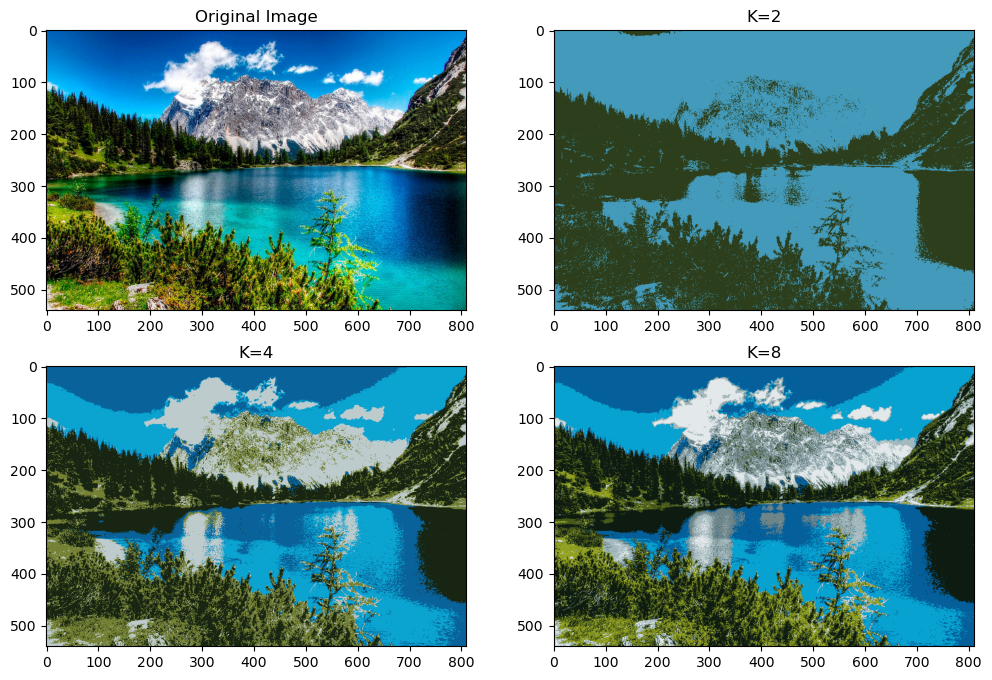

In [118]:
orig_img = cv2.imread('image.jpg')

Z = orig_img.reshape((-1,3))

# convert to np.float32
Z = np.float32(Z)

# define criteria, number of clusters(K) and apply kmeans()
criteria = (cv2.TERM_CRITERIA_EPS + cv2.TERM_CRITERIA_MAX_ITER, 10, 1.0)
def colorQuant(Z, K, criteria):

   ret,label,center=cv2.kmeans(Z,K,None,criteria,10,cv2.KMEANS_RANDOM_CENTERS)
   
   # Now convert back into uint8, and make original image
   center = np.uint8(center)
   res = center[label.flatten()]
   res2 = res.reshape((orig_img.shape))
   return res2
res1 = colorQuant(Z, 2, criteria)
res2 = colorQuant(Z, 5, criteria)
res3 = colorQuant(Z, 8, criteria)

fig = plt.figure(figsize=(12, 8))

plt.subplot(221),plt.imshow(cv2.cvtColor(orig_img, cv2.COLOR_BGR2RGB))
plt.title('Original Image')

plt.subplot(222),plt.imshow(cv2.cvtColor(res1, cv2.COLOR_BGR2RGB))
plt.title('K=2')

plt.subplot(223),plt.imshow(cv2.cvtColor(res2, cv2.COLOR_BGR2RGB))
plt.title('K=4')

plt.subplot(224),plt.imshow(cv2.cvtColor(res3, cv2.COLOR_BGR2RGB))
plt.title('K=8')

plt.show()

# Photometric Transformations

## Grayscale  <a class="anchor" id="grayscale"></a>

Convierte una imagen de color en una escala de grises. Es una transformación fotométrica porque altera los canales RGB combinándolos en una única intensidad luminosa. Es adecuada para análisis donde la información de color no es esencial.

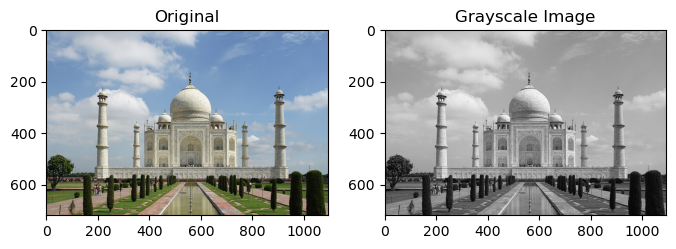

In [119]:
img = cv2.imread('taj.jpeg')
orig_img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

# Use the cvtColor() function to grayscale the image
gray_image = cv2.cvtColor(orig_img, cv2.COLOR_BGR2GRAY)

fig = plt.figure(figsize=(8, 8))

# Subplot for original image
a=fig.add_subplot(1,2,1)
imgplot = plt.imshow(orig_img)

a.set_title('Original')

a = fig.add_subplot(1,2,2)
imgplot = plt.imshow(gray_image, cmap='gray')

a.set_title('Grayscale Image')

plt.show()

## Contrast  <a class="anchor" id="contrast"></a>

El cambio de contraste implica expandir o comprimir la gama de intensidades de los píxeles. Esto resalta (o atenúa) las diferencias entre las partes claras y oscuras de una imagen.

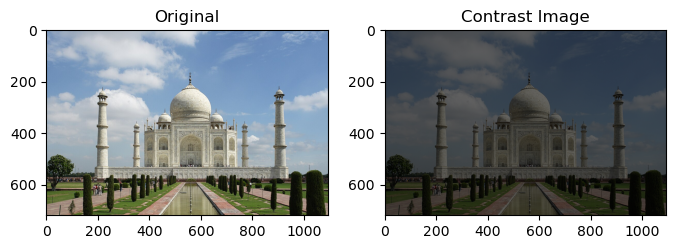

In [120]:
contrast_image = cv2.convertScaleAbs(orig_img, alpha=0.4, beta=0)  # Contraste aumentado

fig = plt.figure(figsize=(8, 8))

# Subplot for original image
a=fig.add_subplot(1,2,1)
imgplot = plt.imshow(orig_img, cmap='gray')

a.set_title('Original')

a = fig.add_subplot(1,2,2)
imgplot = plt.imshow(contrast_image, cmap='gray')

a.set_title('Contrast Image')

plt.show()

## Brightness  <a class="anchor" id="brightness"></a>

El cambio de brillo implica ajustar la luminosidad de la imagen alterando los valores de intensidad de cada píxel. Esto se hace sumando o restando un valor constante a todos los píxeles de la imagen.

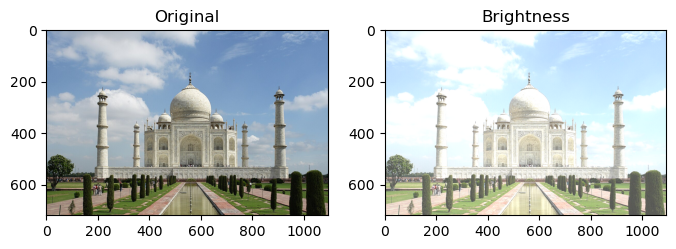

In [121]:
brighter_image = cv2.convertScaleAbs(orig_img, alpha=1.0, beta=80)  # Brillo incrementado

fig = plt.figure(figsize=(8, 8))

# Subplot for original image
a=fig.add_subplot(1,2,1)
imgplot = plt.imshow(orig_img, cmap='gray')

a.set_title('Original')

a = fig.add_subplot(1,2,2)
imgplot = plt.imshow(brighter_image, cmap='gray')

a.set_title('Brightness')

plt.show()

## Negative  <a class="anchor" id="negative2"></a>

El negativo de una imagen es útil en la visualización de imágenes de rayos X o resonancias magnéticas en el campo médico. Resaltar las áreas claras sobre un fondo oscuro puede ayudar a médicos y especialistas a identificar características anormales, como lesiones o fracturas, que podrían pasar desapercibidas en la imagen original.

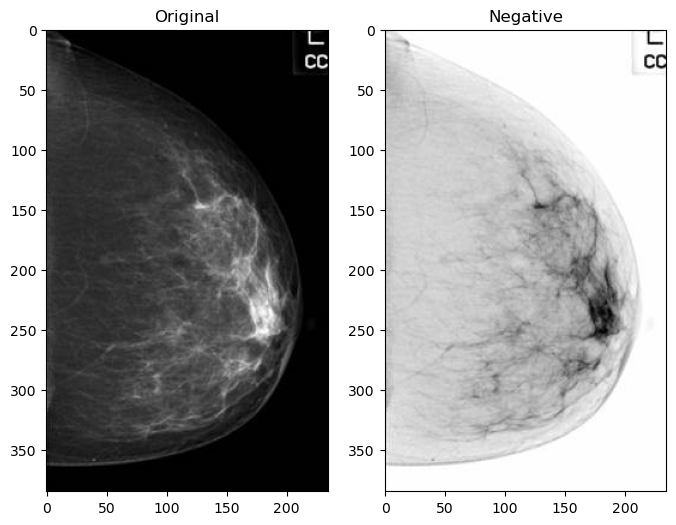

In [122]:
mamografia = cv2.imread('mamografia.jpg', cv2.IMREAD_COLOR)
orig_mamografia = cv2.cvtColor(mamografia, cv2.COLOR_BGR2RGB)

# Obtener el negativo de la imagen
negative_image = 255 - orig_mamografia

fig = plt.figure(figsize=(8, 8))

# Subplot for original image
a=fig.add_subplot(1,2,1)
imgplot = plt.imshow(orig_mamografia)

a.set_title('Original')

a = fig.add_subplot(1,2,2)
imgplot = plt.imshow(negative_image)

a.set_title('Negative')

plt.show()

## Gamma Correction  <a class="anchor" id="gamma"></a>

La corrección de gamma es una técnica de procesamiento de imágenes que ajusta el brillo y el contraste de manera no lineal para mejorar la representación visual de los píxeles. Esta transformación se basa en una función exponencial que modifica los niveles de intensidad de una imagen, haciéndola más brillante o más oscura según el valor de gamma aplicado. Es especialmente útil para compensar las diferencias entre cómo los sensores digitales capturan la luz y cómo el ojo humano la percibe, optimizando la calidad visual en aplicaciones como fotografía, video y análisis médico.


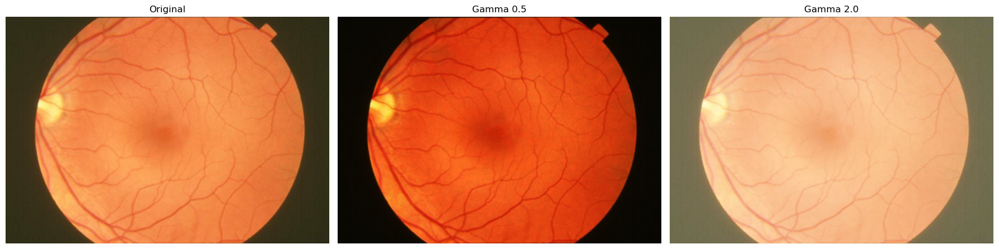

In [123]:
def apply_gamma_correction(image, gamma):
	inv_gamma = 1.0 / gamma
	table = np.array([(i / 255.0) ** inv_gamma * 255 for i in range(256)]).astype("uint8")
	return cv2.LUT(image, table)

img = cv2.imread('retina.jpeg')
orig_img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

# Aplicar corrección de gamma con diferentes valores
gamma_low = apply_gamma_correction(orig_img, 0.5)   # Aumenta el brillo
gamma_high = apply_gamma_correction(orig_img, 2.0)  # Reduce el brillo

# Mostrar resultados
plt.figure(figsize=(18, 6))
plt.subplot(1, 3, 1)
plt.title("Original")
plt.imshow(orig_img)
plt.axis("off")

plt.subplot(1, 3, 2)
plt.title("Gamma 0.5")
plt.imshow(gamma_low)
plt.axis("off")

plt.subplot(1, 3, 3)
plt.title("Gamma 2.0")
plt.imshow(gamma_high)
plt.axis("off")

plt.tight_layout()
plt.show()

## Substract Images  <a class="anchor" id="substract"></a>

La sustracción de imágenes es una técnica comúnmente utilizada en aplicaciones de visión por computadora, como la detección de movimiento. Esta técnica se usa para comparar dos imágenes tomadas en momentos diferentes, y detectar las diferencias que indican un cambio, como el movimiento de objetos en una escena. Es muy útil en seguridad y sistemas de vigilancia, ya que permite identificar movimientos en una escena estática, como en las cámaras de seguridad o en los sistemas de monitoreo de tráfico.

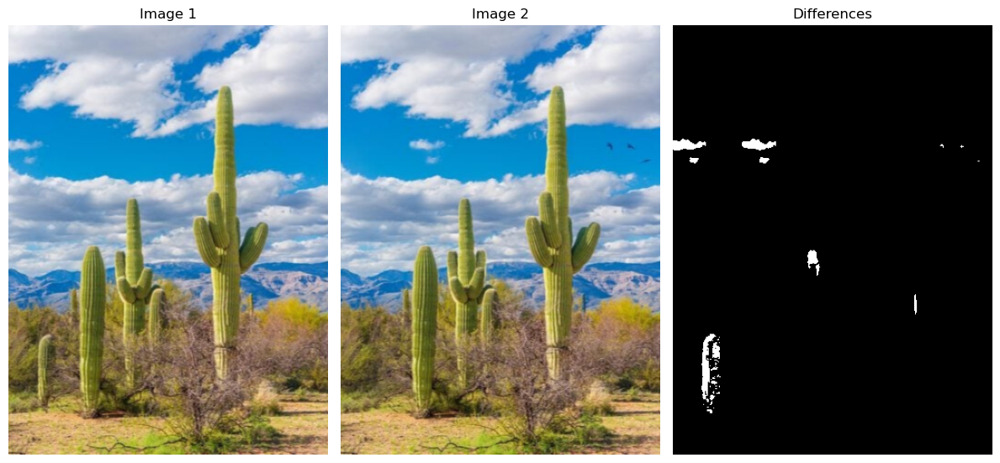

In [124]:
# Función para realizar la sustracción de imágenes
def subtract_images(image1, image2):
    # Convertir las imágenes a escala de grises
    gray1 = cv2.cvtColor(image1, cv2.COLOR_BGR2GRAY)
    gray2 = cv2.cvtColor(image2, cv2.COLOR_BGR2GRAY)
    
    # Realizar la sustracción y aplicar una máscara binaria
    diff = cv2.absdiff(gray1, gray2)
    _, threshold_diff = cv2.threshold(diff, 30, 255, cv2.THRESH_BINARY)
    return threshold_diff

# Cargar dos imágenes para comparar (asegurarse de haber subido imágenes similares)
image1 = cv2.imread('sub1.png')
image2 = cv2.imread('sub2.png')

# Realizar la sustracción de imágenes
difference = subtract_images(image1, image2)

# Mostrar las imágenes y la diferencia
plt.figure(figsize=(12, 6))
plt.subplot(1, 3, 1)
plt.title("Image 1")
plt.imshow(cv2.cvtColor(image1, cv2.COLOR_BGR2RGB))
plt.axis("off")

plt.subplot(1, 3, 2)
plt.title("Image 2")
plt.imshow(cv2.cvtColor(image2, cv2.COLOR_BGR2RGB))
plt.axis("off")

plt.subplot(1, 3, 3)
plt.title("Differences")
plt.imshow(difference, cmap='gray')
plt.axis("off")

plt.tight_layout()
plt.show()